In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [4]:
import seaborn as sns

colors = [(0,0,0)]
colors =[(0,0,0)] +  sns.color_palette("muted", 6)+[(.2,.2,.2)]


outlier_functions = ['control', 'kNN', 'LOF', 'iforest', 'pca', 'kde', 'mahalanobis','random']
color_dict = dict(zip(outlier_functions, colors))



In [5]:
# Load the CSV data
data = pd.read_csv("results/regression/results_test_w_BM.csv")

In [6]:
data

,Dataset,Split_Val,Outlier_Function,Reg Function,Threshold_Val,ParA_Val,ParB_Val,Outliers Removed Pct,rMSE,R_squared,Adjusted_R_squared,MAE,Max Error
0,sulfur_normMM_noise_0.1,400,kNN,elastic_net_regression,0.05,2,Med,0.05,5.355544e-02,-1.598751e-03,-2.219962e-03,0.026022,9.213579e-01
1,sulfur_normMM_noise_0.1,400,kNN,lasso_regression,0.05,2,Med,0.05,5.355544e-02,-1.598751e-03,-2.219962e-03,0.026022,9.213579e-01
2,sulfur_normMM_noise_0.1,400,kNN,multiple_linear_regression,0.05,2,Med,0.05,5.298022e-02,1.980108e-02,1.919314e-02,0.026029,9.055328e-01
3,sulfur_normMM_noise_0.1,400,kNN,polynomial_regression,0.05,2,Med,0.05,4.847629e-02,1.793739e-01,1.788650e-01,0.022758,8.675293e-01
4,sulfur_normMM_noise_0.1,400,kNN,random_forest_regression,0.05,2,Med,0.05,4.221694e-02,3.776136e-01,3.772276e-01,0.015910,9.249810e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...
106325,aileron_norm,1200,random,multiple_linear_regression,0.35,2,Med,0.35,1.787160e-04,8.072226e-01,8.067143e-01,0.000134,1.556322e-03
106326,aileron_norm,1200,random,polynomial_regression,0.35,2,Med,0.35,2.351668e+06,-3.340000e+19,-3.350000e+19,45280.302030,2.151044e+08
106327,aileron_norm,1200,random,random_forest_regression,0.35,2,Med,0.35,1.821360e-04,7.997737e-01,7.992457e-01,0.000133,1.369000e-03
106328,aileron_norm,1200,random,ridge_regression,0.35,2,Med,0.35,1.763900e-04,8.122076e-01,8.117125e-01,0.000131,1.482980e-03


In [7]:


# Call the function with the desired input parameters
outlier_function = 'outlier_function_name'
dataset = 'run_or_walk_normMM_noise_0.1'
split_val = 1000
reg_function = 'logistic_regression_classifier'
Threshold_val = 1.8



In [8]:
split_vals = data['Split_Val'].unique()
reg_functions = data['Reg Function'].unique()
reg_functions_names = [func.replace('_regression', '') for func in reg_functions]



In [52]:

metric = 'rMSE'


In [10]:
filtered_df = data[data['Dataset'] == dataset]
filtered_df = filtered_df[filtered_df['Split_Val'] == split_val]
filtered_df = filtered_df[filtered_df['Reg Function'] == reg_function]
unique_values = filtered_df['Outlier_Function'].unique()



In [11]:
datasets=['sulfur_normMM', 'sulfur_normMM_noise_0.1', 'sulfur_normMM_noise_0.2',
    'bike_share_encode_normMM','bike_share_encode_normMM_noise_0.1','bike_share_encode_normMM_noise_0.2',
    'merged_wine_norm', 'merged_wine_norm_noise_0.1', 'merged_wine_norm_noise_0.2', 
    'diamonds_norm','diamonds_norm_noise_0.1', 'diamonds_norm_noise_0.2',
    'aileron_norm','aileron_norm_noise_0.1', 'aileron_norm_noise_0.2',
    'abalone_norm_hot_encoded', 'abalone_norm_hot_encoded_noise_0.1','abalone_norm_hot_encoded_noise_0.2']


In [12]:
filtered_df = data[data['Split_Val'] == split_val]
d=filtered_df[(filtered_df['Outlier_Function'] == 'mahalanobis')]
d['Dataset'].unique()

array(['diamonds_norm', 'aileron_norm', 'sulfur_normMM_noise_0.1',
       'sulfur_normMM_noise_0.2', 'bike_share_encode_normMM_noise_0.1',
       'bike_share_encode_normMM_noise_0.2', 'merged_wine_norm_noise_0.2',
       'diamonds_norm_noise_0.2', 'aileron_norm_noise_0.2',
       'abalone_norm_hot_encoded', 'merged_wine_norm',
       'merged_wine_norm_noise_0.1', 'diamonds_norm_noise_0.1',
       'aileron_norm_noise_0.1', 'abalone_norm_hot_encoded_noise_0.1',
       'sulfur_normMM', 'bike_share_encode_normMM',
       'abalone_norm_hot_encoded_noise_0.2'], dtype=object)

<h3> toggle random</h3>

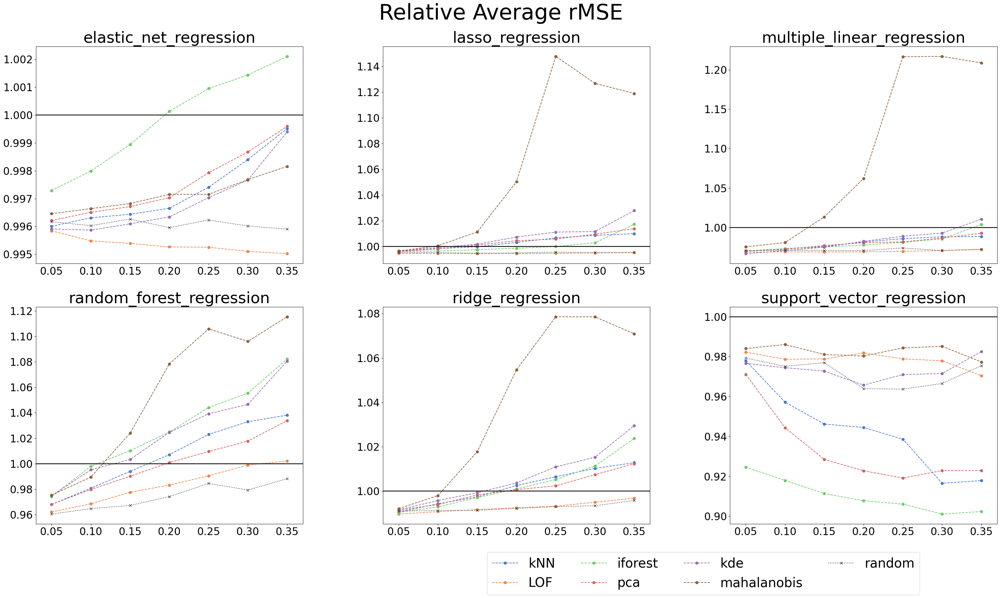

In [55]:
filtered_df = data[data['Reg Function'] != 'polynomial_regression']
reg_functions = filtered_df['Reg Function'].unique()
fig, axs = plt.subplots(2, 3, figsize=(40, 20))

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.3)

for i, class_function in enumerate(reg_functions):

    filtered_df2 = filtered_df[filtered_df['Reg Function'] == class_function]
    
    ylim_min = max(-0.5, filtered_df2[metric].min())  # Dynamic calculation of y-axis limits
    ylim_max = min(1, filtered_df2[metric].max())  # Dynamic calculation of y-axis limits
    
    control_df = filtered_df2[filtered_df2['Outlier_Function'] == 'control']

    for j, OR_func in enumerate(outlier_functions):
        if OR_func == 'control':
            continue
        filtered_df3 = filtered_df2[filtered_df2['Outlier_Function'] == OR_func]
        
        values_arr = []
        
        for k, dataset in enumerate(datasets): 
            filtered_df4 = filtered_df3[filtered_df3['Dataset'] == dataset]
            
            control_val = control_df[control_df['Dataset'] == dataset][metric].mean()
            
            contam_pct = filtered_df4['Outliers Removed Pct'].apply(lambda x: round(x / 0.05) * 0.05)
            accuracy_values = filtered_df4[metric] / control_val
            max_accuracy = accuracy_values.groupby(contam_pct).min() 
            if len(max_accuracy) != 7:
                continue
            values_arr.append(max_accuracy.to_list())

        mean_values = np.mean(values_arr, axis=0)  # Calculate the mean values across all datasets
        
        if OR_func == 'random':
            axs[int(i/3)][i%3].plot(contam_pct.unique(), mean_values, marker='x', linestyle=':', color=color_dict[OR_func], label=OR_func)
        else:
            axs[int(i/3)][i%3].plot(contam_pct.unique(), mean_values, marker='o', linestyle='--', color=color_dict[OR_func], label=OR_func)  # Add label for each OR_func
            
        axs[int(i/3)][i%3].set_title(f"{class_function}", fontsize=36)
        axs[int(i/3)][i%3].set_xlim(0.03, 0.37)
        # axs[int(i/3)][i%3].set_ylim(ylim_min, ylim_max)
        axs[int(i/3)][i%3].axhline(y=1, color='black')
        axs[int(i/3)][i%3].tick_params( axis='both', which='major', labelsize=24)


fig.suptitle(f'Relative Average {metric}', fontsize=50, y=.95)

plt.legend(loc='upper center', bbox_to_anchor=(-0.1, -0.1), ncol=4, fontsize=30)

# Show the plot
plt.show()

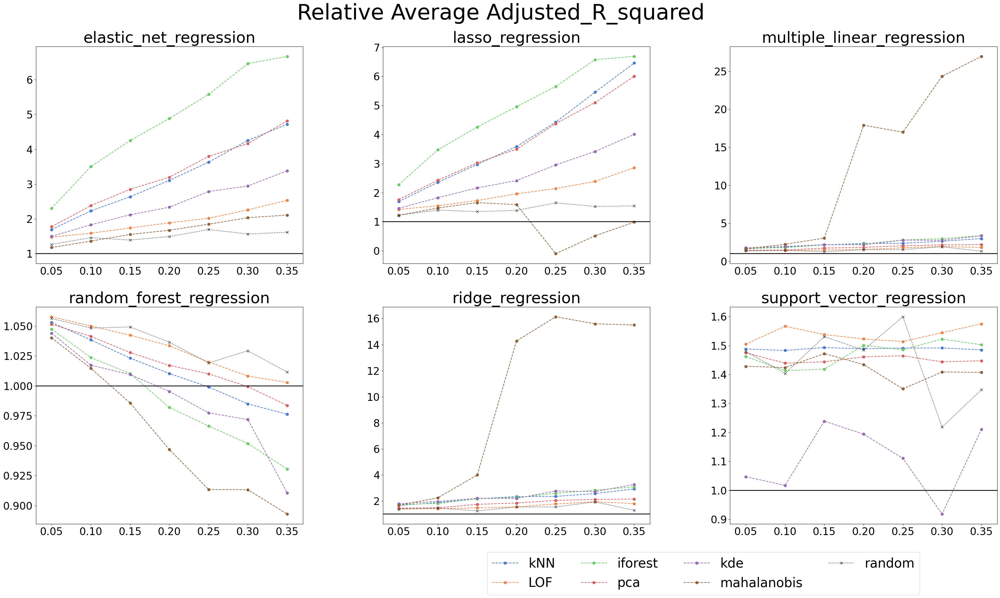

In [57]:
filtered_df = data[data['Reg Function'] != 'polynomial_regression']
reg_functions = filtered_df['Reg Function'].unique()
fig, axs = plt.subplots(2, 3, figsize=(40, 20))
metric = 'Adjusted_R_squared'
# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.3)

for i, class_function in enumerate(reg_functions):

    filtered_df2 = filtered_df[filtered_df['Reg Function'] == class_function]
    
    ylim_min = max(-0.5, filtered_df2[metric].min())  # Dynamic calculation of y-axis limits
    ylim_max = min(1, filtered_df2[metric].max())  # Dynamic calculation of y-axis limits
    
    control_df = filtered_df2[filtered_df2['Outlier_Function'] == 'control']

    for j, OR_func in enumerate(outlier_functions):
        if OR_func == 'control':
            continue
        filtered_df3 = filtered_df2[filtered_df2['Outlier_Function'] == OR_func]
        
        values_arr = []
        
        for k, dataset in enumerate(datasets): 
            filtered_df4 = filtered_df3[filtered_df3['Dataset'] == dataset]
            
            control_val = control_df[control_df['Dataset'] == dataset][metric].mean()
            
            contam_pct = filtered_df4['Outliers Removed Pct'].apply(lambda x: round(x / 0.05) * 0.05)
            accuracy_values = filtered_df4[metric] / control_val
            max_accuracy = accuracy_values.groupby(contam_pct).max() 
            if len(max_accuracy) != 7:
                continue
            values_arr.append(max_accuracy.to_list())

        mean_values = np.mean(values_arr, axis=0)  # Calculate the mean values across all datasets
        
        if OR_func == 'random':
            axs[int(i/3)][i%3].plot(contam_pct.unique(), mean_values, marker='x', linestyle=':', color=color_dict[OR_func], label=OR_func)
        else:
            axs[int(i/3)][i%3].plot(contam_pct.unique(), mean_values, marker='o', linestyle='--', color=color_dict[OR_func], label=OR_func)  # Add label for each OR_func
            
        axs[int(i/3)][i%3].set_title(f"{class_function}", fontsize=36)
        axs[int(i/3)][i%3].set_xlim(0.03, 0.37)
        # axs[int(i/3)][i%3].set_ylim(ylim_min, ylim_max)
        axs[int(i/3)][i%3].axhline(y=1, color='black')
        axs[int(i/3)][i%3].tick_params( axis='both', which='major', labelsize=24)


fig.suptitle(f'Relative Average {metric}', fontsize=50, y=.95)

plt.legend(loc='upper center', bbox_to_anchor=(-0.1, -0.1), ncol=4, fontsize=30)

# Show the plot
plt.show()


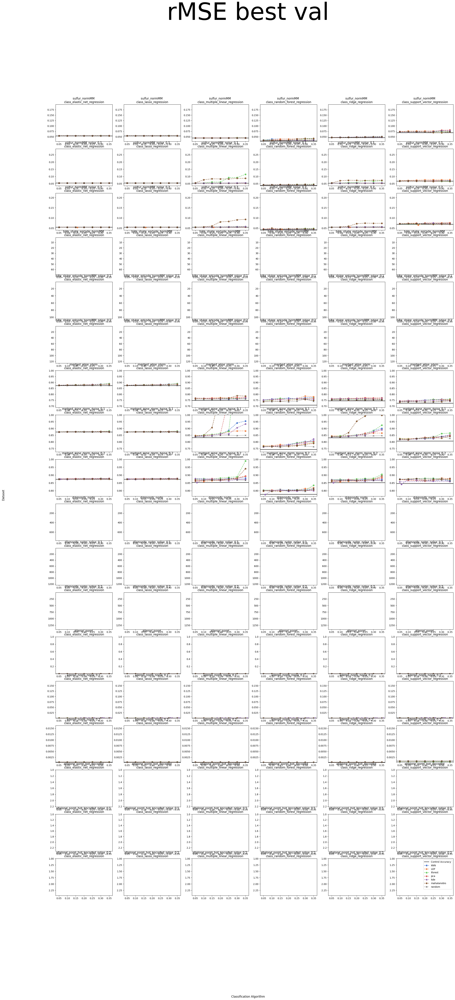

In [ ]:


filtered_df =data
fig, axs = plt.subplots( len(datasets),len(reg_functions), figsize=(30,60))

for i, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    
    ylim_min =  filtered_df2[metric].min() # Dynamic calculation of y-axis limits
    ylim_max =  filtered_df2[metric].max() # Dynamic calculation of y-axis limits
    
    for j, class_function in enumerate(reg_functions):
        filtered_df3 = filtered_df2[filtered_df2['Reg Function'] == class_function]
        for k, OR_func in enumerate(outlier_functions):
            # print(f'Plotting for {OR_func}')
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            if OR_func == 'control':
                accuracy_values = or_func_df[metric]
                avg_accuracy = accuracy_values.mean()
                axs[i][j].axhline(y=avg_accuracy, color='black', label='Control Accuracy')
                continue
            
            
            contam_pct = or_func_df['Outliers Removed Pct'].apply(lambda x: round(x, 2))
            
            accuracy_values = or_func_df[metric]
            max_accuracy = accuracy_values.groupby(contam_pct).min()  # Get the maximum value at each threshold
            
            
            if OR_func == 'random':
                axs[i][j].plot(contam_pct.unique(), max_accuracy, marker='x',  linestyle=':',color =color_dict[OR_func] , label=OR_func)
                continue

            axs[i][j].plot(contam_pct.unique(), max_accuracy, marker='o',linestyle='--',color =color_dict[OR_func],label=OR_func)  # Add label for each OR_func
            
        axs[i][j].set_title(f"{dataset} \nclass_{class_function}")
        axs[i][j].set_ylim(ylim_min, ylim_max)
        axs[i][j].set_xlim(0.03, 0.37)
    
fig.supylabel('Dataset')

fig.supxlabel('Classification Algorithm')  
fig.suptitle(f'{metric} best val', fontsize=100)

plt.legend()

# Show the plot
plt.show()

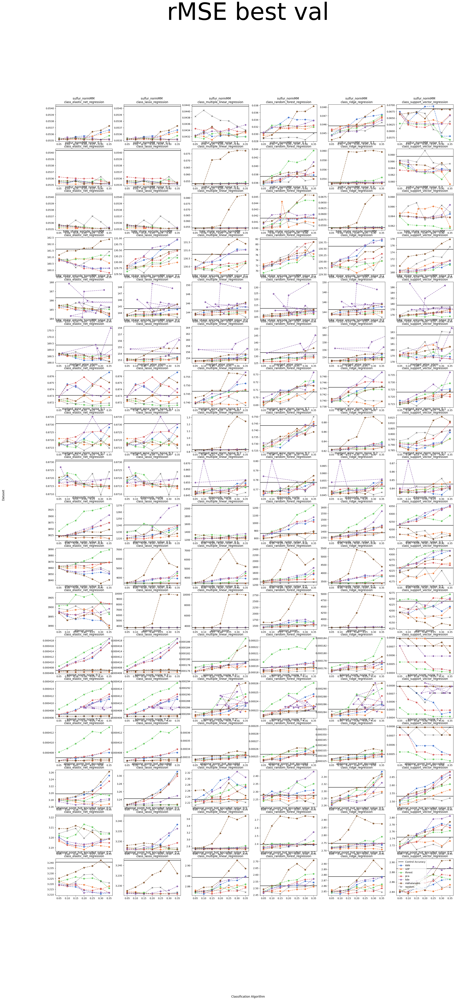

In [ ]:


filtered_df =data
fig, axs = plt.subplots( len(datasets),len(reg_functions), figsize=(30,60))

for i, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    
    ylim_min = max(-.5, filtered_df2[metric].min()) # Dynamic calculation of y-axis limits
    ylim_max =  min(1,filtered_df2[metric].max()) # Dynamic calculation of y-axis limits
    
    for j, class_function in enumerate(reg_functions):
        filtered_df3 = filtered_df2[filtered_df2['Reg Function'] == class_function]
        for k, OR_func in enumerate(outlier_functions):
            # print(f'Plotting for {OR_func}')
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            if OR_func == 'control':
                accuracy_values = or_func_df[metric]
                avg_accuracy = accuracy_values.mean()
                axs[i][j].axhline(y=avg_accuracy, color='black', label='Control Accuracy')
                continue
            
            
            contam_pct = or_func_df['Outliers Removed Pct'].apply(lambda x: round(x, 2))
            
            accuracy_values = or_func_df[metric]
            max_accuracy = accuracy_values.groupby(contam_pct).min()  # Get the maximum value at each threshold
            
            
            if OR_func == 'random':
                axs[i][j].plot(contam_pct.unique(), max_accuracy, marker='x',  linestyle=':',color =color_dict[OR_func] , label=OR_func)
                continue

            axs[i][j].plot(contam_pct.unique(), max_accuracy, marker='o',linestyle='--',color =color_dict[OR_func],label=OR_func)  # Add label for each OR_func
            
        axs[i][j].set_title(f"{dataset} \nclass_{class_function}")
        # axs[i][j].set_ylim(ylim_min, ylim_max)
        axs[i][j].set_xlim(0.03, 0.37)
    
fig.supylabel('Dataset')

fig.supxlabel('Classification Algorithm')  
fig.suptitle(f'{metric} best val', fontsize=100)

plt.legend()

# Show the plot
plt.show()

<h2>dataset X reg with uniform scale</h2>

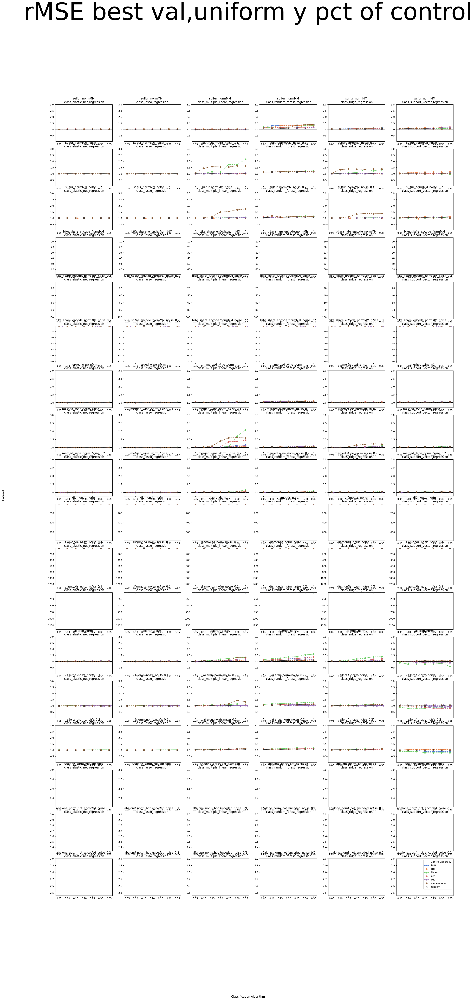

In [ ]:
filtered_df =data


filtered_df =data[data['Reg Function'] != 'polynomial_regression']
fig, axs = plt.subplots( len(datasets),len(reg_functions), figsize=(30,60))

for i, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    
    ylim_min = max(-.5, filtered_df2[metric].min()) # Dynamic calculation of y-axis limits
    ylim_max =  filtered_df2[metric].max()# Dynamic calculation of y-axis limits
    
    for j, class_function in enumerate(reg_functions):
        filtered_df3 = filtered_df2[filtered_df2['Reg Function'] == class_function]
        
        control_df = filtered_df3[filtered_df3['Outlier_Function'] == 'control']
        control_acc = control_df[metric].mean()
        
        axs[i][j].axhline(y=1, color='black', label='Control Accuracy')
        
        
        for k, OR_func in enumerate(outlier_functions):
            # print(f'Plotting for {OR_func}')
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            if OR_func == 'control':
                continue
            
            
            contam_pct = or_func_df['Outliers Removed Pct'].apply(lambda x: round(x, 2))
            
            accuracy_values = or_func_df[metric]/control_acc
            max_accuracy = accuracy_values.groupby(contam_pct).max()  # Get the maximum value at each threshold
            
            
            if OR_func == 'random':
                axs[i][j].plot(contam_pct.unique(), max_accuracy, marker='x',  linestyle=':',color =color_dict[OR_func] , label=OR_func)
                continue

            axs[i][j].plot(contam_pct.unique(), max_accuracy, marker='o',linestyle='--',color =color_dict[OR_func],label=OR_func)  # Add label for each OR_func
            
        axs[i][j].set_title(f"{dataset} \nclass_{class_function}")
        axs[i][j].set_ylim(ylim_min, 3)
        axs[i][j].set_xlim(0.03, 0.37)
    
fig.supylabel('Dataset')

fig.supxlabel('Classification Algorithm')  
fig.suptitle(f'{metric} best val,uniform y pct of control', fontsize=100)

plt.legend()

# Show the plot
plt.show()

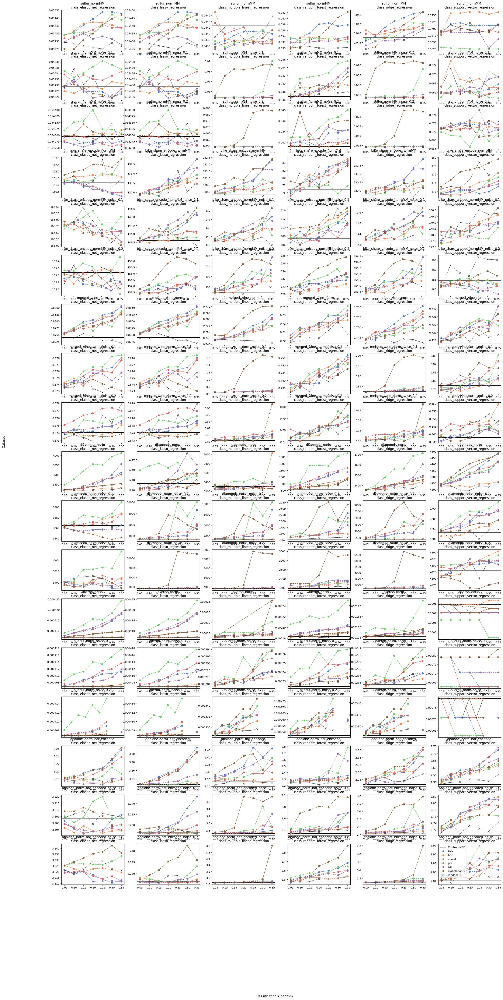

In [ ]:
# Create a figure and subplots
filtered_df = data[data['Split_Val'] == split_val]
filtered_df = filtered_df[(filtered_df['ParA_Val'] == 4) | (filtered_df['Outlier_Function'] == 'kde') | (filtered_df['Outlier_Function'] == 'mahalanobis') | (filtered_df['Outlier_Function'] == 'control')| (filtered_df['Outlier_Function'] == 'random') ]
fig, axs = plt.subplots( len(datasets),len(reg_functions), figsize=(30, 60))

for i,dataset in enumerate(datasets) :
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    
    for j,reg_function in enumerate(reg_functions):
        filtered_df3 = filtered_df2[filtered_df2['Reg Function'] == reg_function]
        for k, OR_func in enumerate(outlier_functions):
            # print(f'Plotting for {OR_func}')
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            if OR_func == 'control':
                rMSE_values = or_func_df[metric]
                avg_rMSE = rMSE_values.mean()
                axs[i][j].axhline(y=avg_rMSE, color='k', label='Control rMSE')
                continue
            elif OR_func == 'random':
                contam_pct = or_func_df['Outliers Removed Pct']
                rMSE_values = or_func_df[metric]
                axs[i][j].plot(contam_pct, rMSE_values, marker='x',  linestyle=':',color =color_dict[OR_func] , label=OR_func)
                continue
            
            contam_pct = or_func_df['Outliers Removed Pct']
            rMSE_values = or_func_df[metric]
            axs[i][j].plot(contam_pct, rMSE_values, marker='o',  linestyle='--',color = color_dict[OR_func] ,label=OR_func)  # Add label for each OR_func
            
        axs[i][j].set_title(f"{dataset} \nclass_{reg_function}")
    
fig.supylabel('Dataset')

fig.supxlabel('Classification Algorithm')  
plt.legend()

# Show the plot
plt.show()

Plotting for kNN
Plotting for LOF
Plotting for control
Plotting for iforest
Plotting for pca
Plotting for kde
Plotting for mahalanobis
Plotting for random


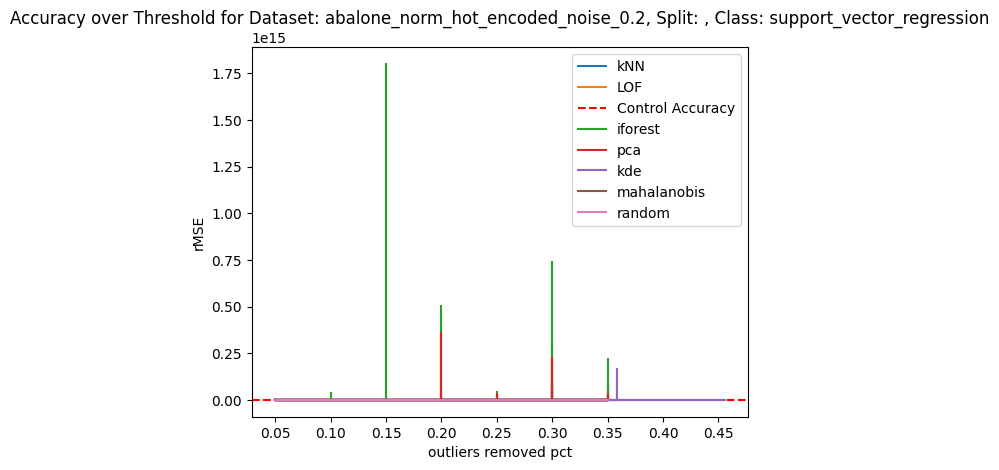

In [ ]:


for i, OR_func in enumerate(unique_values):
    print(f'Plotting for {OR_func}')
    or_func_df = filtered_df[filtered_df['Outlier_Function'] == OR_func]
    if OR_func == 'control':
        rMSE_values = or_func_df[metric]
        avg_rMSE = rMSE_values.mean()
        plt.axhline(y=avg_rMSE, color='r', linestyle='--', label='Control Accuracy')
        continue
    
    contam_pct = or_func_df['Outliers Removed Pct']
    rMSE_values = or_func_df[metric]
    plt.plot(contam_pct, rMSE_values, label=OR_func)  # Add label for each OR_func

plt.xlabel('outliers removed pct')
plt.ylabel(metric)
plt.title(f'Accuracy over Threshold for Dataset: {dataset}, Split: , Class: {reg_function}')
plt.legend()  # Add legend
plt.show()

<h2>split_val X Reg Function</h2>
sulfur data

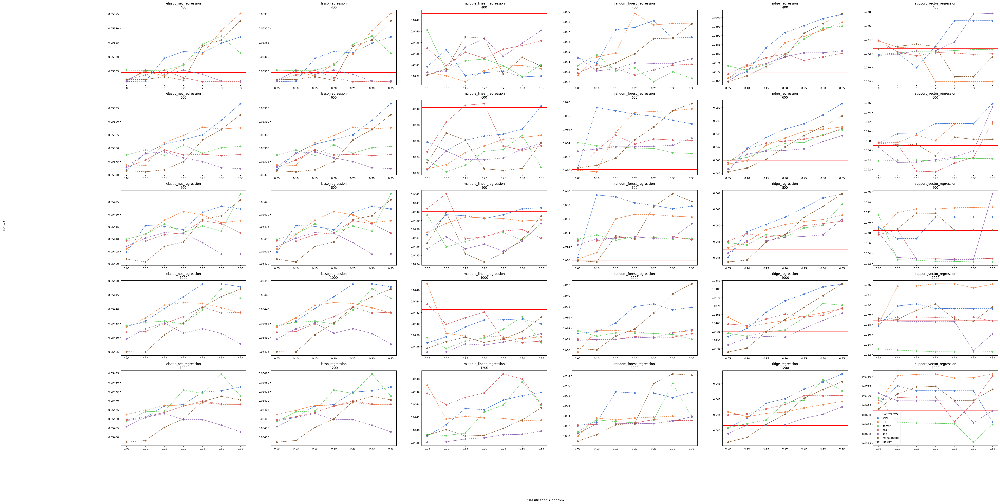

In [ ]:
dataset='sulfur_normMM'
# Create a figure and subplots
filtered_df = data[data['Dataset'] == dataset]
filtered_df = filtered_df[(filtered_df['ParA_Val'] == 4) | (filtered_df['Outlier_Function'] == 'kde') | (filtered_df['Outlier_Function'] == 'mahalanobis')| (filtered_df['Outlier_Function'] == 'control')]
fig, axs = plt.subplots( len(split_vals), len(reg_functions),figsize=(60, 30))


for i, split_val in enumerate(split_vals):
    filtered_df2 = filtered_df[filtered_df['Split_Val'] == split_val ]
    
    for j, reg_function in enumerate(reg_functions):
        filtered_df3 = filtered_df2[filtered_df2['Reg Function'] == reg_function]
        for k, OR_func in enumerate(outlier_functions):
            # print(f'Plotting for {OR_func}')
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            if OR_func == 'control':
                rMSE_values = or_func_df[metric]
                avg_rMSE = rMSE_values.mean()
                axs[i][j].axhline(y=avg_rMSE, color='r',label='Control rMSE')
                continue
            
            contam_pct = or_func_df['Outliers Removed Pct']
            rMSE_values = or_func_df[metric]
            axs[i][j].plot(contam_pct, rMSE_values, marker='o',  linestyle='--', color= color_dict[OR_func] ,label=OR_func)  # Add label for each OR_func
            
        axs[i][j].set_title(f"{reg_function}\n{split_val}")
    
fig.supylabel('splitval')

fig.supxlabel('Classification Algorithm')  
plt.legend()

# Show the plot
plt.show()

In [ ]:
# split_val=1000
# # Create a figure and subplots
# filtered_df = data[data['Split_Val'] == split_val]
# filtered_df = filtered_df[(filtered_df['ParA_Val'] == 4) | (filtered_df['Outlier_Function'] == 'kde')| (filtered_df['Outlier_Function'] == 'mahalanobis') | (filtered_df['Outlier_Function'] == 'control')]
# fig, axs = plt.subplots( len(outlier_functions)-1, len(reg_functions),figsize=(60, 30))


# control_df = filtered_df[filtered_df['Outlier_Function'] == 'control']
# for i, outlier_function in enumerate(outlier_functions):
#     filtered_df2 = filtered_df[filtered_df['Outlier_Function'] == outlier_function ]
#     if outlier_function == 'control':
#         continue
#     for j, reg_function in enumerate(reg_functions):
#         filtered_df3 = filtered_df2[filtered_df2['Reg Function'] == reg_function]
#         control_df2 = control_df[control_df['Reg Function'] == reg_function]
#         for k, dataset in enumerate(datasets):
#             # print(f'Plotting for {OR_func}')
#             or_func_df = filtered_df3[filtered_df3['Dataset'] == dataset]
#             control_df3 = control_df2[control_df2['Dataset'] == dataset]

            
#             control = np.mean(control_df3[metric])
            
#             contam_pct = or_func_df['Outliers Removed Pct']
#             rMSE_values = or_func_df[metric]/control
#             axs[i][j].plot(contam_pct, rMSE_values, label=dataset)  # Add label for each OR_func
            
#         axs[i][j].set_title(f"{outlier_function} \nreg_{reg_function}")
#         axs[i][j].set_yscale('log')  # Set y-axis to logarithmic scale

# fig.supylabel('splitval')

# fig.supxlabel('Classification Algorithm')  
# plt.legend()

# # Show the plot
# plt.show()

bar chart

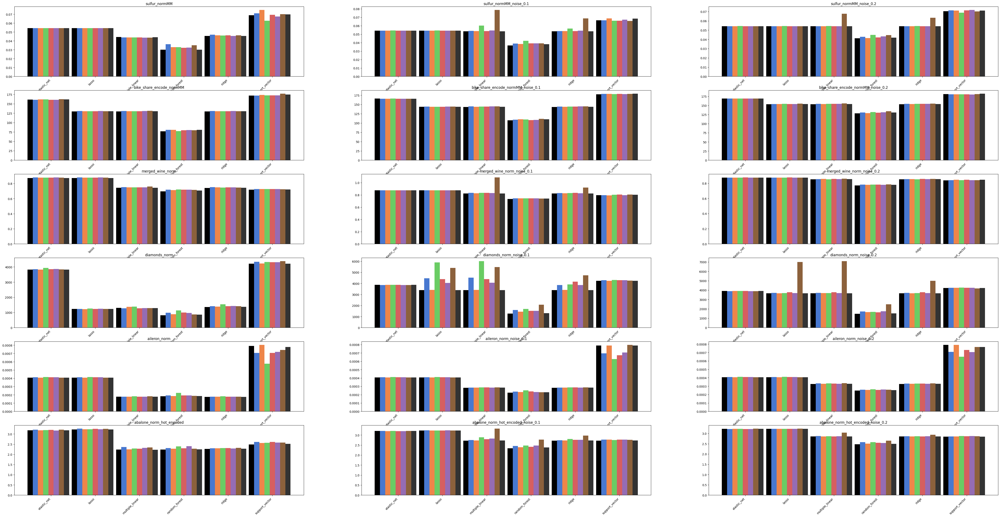

In [ ]:
split_val=1000
# Grouped bar chart
# Create a figure and subplots
filtered_df = data[data['Split_Val'] == split_val]
filtered_df = filtered_df[(filtered_df['ParA_Val'] == 4) | (filtered_df['Outlier_Function'] == 'kde') | (filtered_df['Outlier_Function'] == 'mahalanobis')| (filtered_df['Outlier_Function'] == 'random')| (filtered_df['Outlier_Function'] == 'control')]


filtered_df = filtered_df[filtered_df['Reg Function'] != "polynomial_regression"]
reg_functions = filtered_df['Reg Function'].unique()




fig, axs = plt.subplots( int(len(datasets)/3),3, figsize=(60, 30))

# Set the width of each bar
bar_width = 0.2

# Set the x positions of the bars
x = np.arange(len(reg_functions)) *1.7

for a, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    i=int(a/3)
    if dataset.endswith('0.1'):
        j=1
    elif dataset.endswith('0.2'):
        j=2
    else:
        j=0 
        
        
    # Loop through each reg_function
    for b, reg_function in enumerate(reg_functions):
        filtered_df3 = filtered_df2[filtered_df2['Reg Function'] == reg_function]
        
        # Loop through each outlier function
        for c, OR_func in enumerate(outlier_functions):
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            rMSE_mean = or_func_df[metric].mean()
            
            # Plot the bar for each outlier function
            axs[i][j].bar(x[b] + (c * bar_width), rMSE_mean, width=bar_width, label=OR_func,color=color_dict[OR_func] )
            
    axs[i][j].set_title(f"{dataset}")
    axs[i][j].set_xticks(x + (len(outlier_functions) * bar_width) / 2)
    axs[i][j].set_xticklabels(reg_functions_names[:3] + reg_functions_names[4:], rotation=45, ha='right')



plt.show()

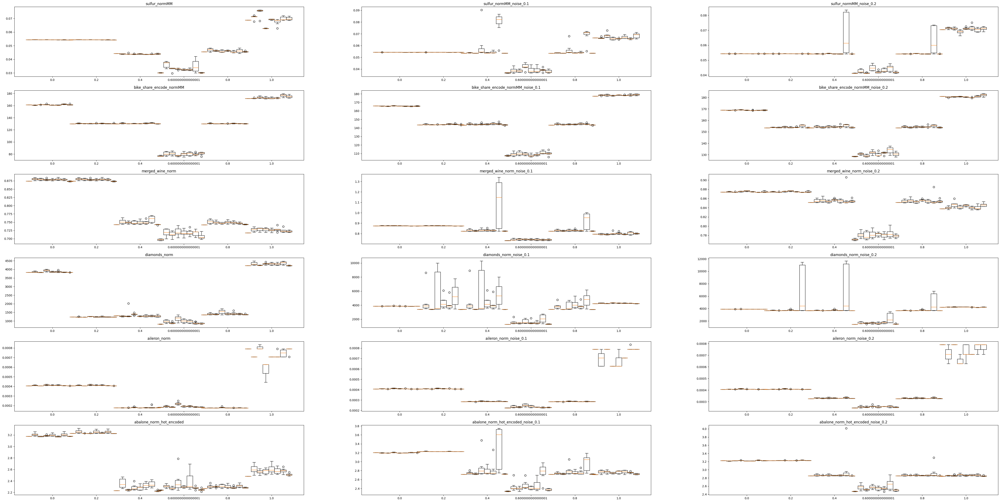

In [ ]:


fig, axs = plt.subplots( int(len(datasets)/3),3, figsize=(60, 30))

# Set the width of each bar
bar_width = 0.2

# Set the x positions of the bars
x = np.arange(len(reg_functions)) *1.5

for a, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    i=int(a/3)
    if dataset.endswith('0.1'):
        j=1
    elif dataset.endswith('0.2'):
        j=2
    else:
        j=0 
        
        
    # Loop through each reg_function
    for b, reg_function in enumerate(reg_functions):
        filtered_df3 = filtered_df2[filtered_df2['Reg Function'] == reg_function]
        
        # Loop through each outlier function
        for c, OR_func in enumerate(outlier_functions):
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            rMSE_mean = or_func_df[metric].mean()
            rMSE_values = or_func_df[metric]
            
            # Plot the bar for each outlier function
            axs[i][j].boxplot(rMSE_values, positions=[x[b] + (c * bar_width)], widths=bar_width)

            
    axs[i][j].set_title(f"{dataset}")
    axs[i][j].set_xticks(x + (len(outlier_functions) * bar_width) / 2)
    # axs[i][j].set_xticklabels(reg_functions_names, rotation=45, ha='right')

plt.show()

bar chart pct of control

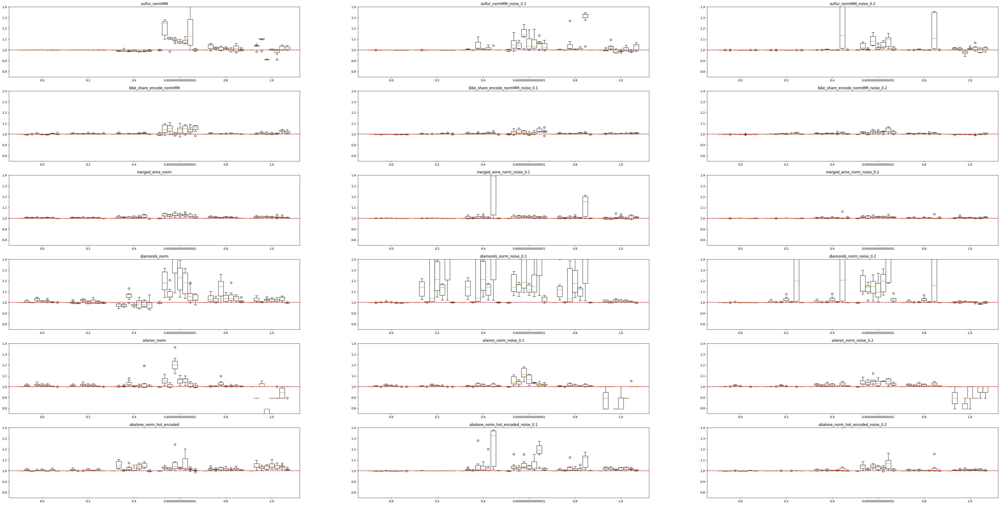

In [ ]:
split_val=1000
# Grouped bar chart
# Create a figure and subplots
filtered_df = data[data['Split_Val'] == split_val]
filtered_df = filtered_df[(filtered_df['ParA_Val'] == 4) | (filtered_df['Outlier_Function'] == 'kde') | (filtered_df['Outlier_Function'] == 'mahalanobis')| (filtered_df['Outlier_Function'] == 'random')| (filtered_df['Outlier_Function'] == 'control')]


filtered_df = filtered_df[filtered_df['Reg Function'] != "polynomial_regression"]
reg_functions = filtered_df['Reg Function'].unique()



fig, axs = plt.subplots( int(len(datasets)/3),3, figsize=(60, 30))

# Set the width of each bar
bar_width = 0.2

# Set the x positions of the bars
x = np.arange(len(reg_functions)) *1.8

for a, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    i=int(a/3)
    if dataset.endswith('0.1'):
        j=1
    elif dataset.endswith('0.2'):
        j=2
    else:
        j=0 
        
        
    # Loop through each reg_function
    for b, reg_function in enumerate(reg_functions):
        filtered_df3 = filtered_df2[filtered_df2['Reg Function'] == reg_function]
        control = filtered_df3[filtered_df3['Outlier_Function'] == 'control']['rMSE'].mean()
        # Loop through each outlier function
        for c, OR_func in enumerate(outlier_functions):
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            rMSE_mean = or_func_df[metric].min()
            
            rMSE_mean_pct = rMSE_mean/control
            rMSE_pct = or_func_df[metric]/control
            # Plot the bar for each outlier function
            axs[i][j].boxplot(rMSE_pct, positions=[x[b] + (c * bar_width)], widths=bar_width)
            
    axs[i][j].set_title(f"{dataset}")
    axs[i][j].set_xticks(x + (len(outlier_functions) * bar_width) / 2)
    axs[i][j].set_ylim(0.75, 1.4)
    # axs[i][j].set_xticklabels(reg_functions_names, rotation=45, ha='right')
    
    axs[i][j].axhline(y=1.0, color='r', linestyle='--')
    
plt.show()

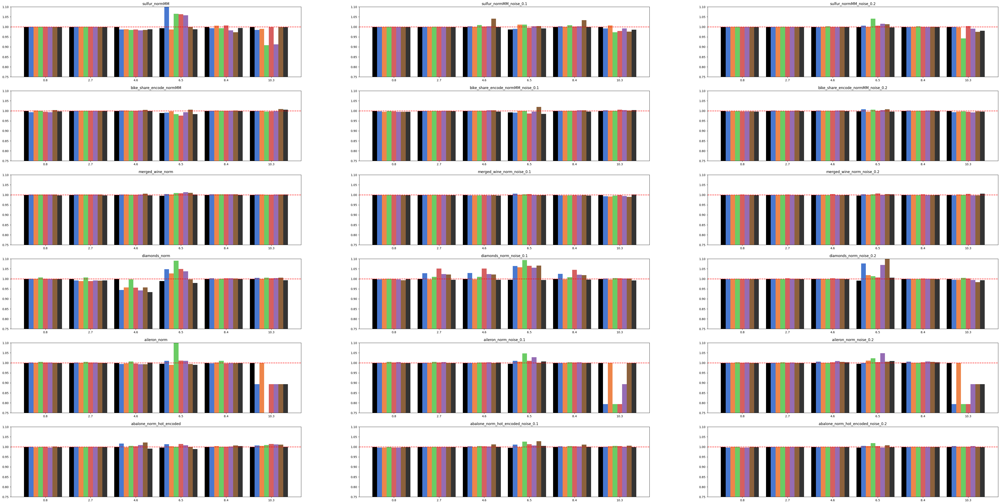

In [ ]:
fig, axs = plt.subplots( int(len(datasets)/3),3, figsize=(60, 30))

# Set the width of each bar
bar_width = 0.2

# Set the x positions of the bars
x = np.arange(len(reg_functions)) *1.9

for a, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    i=int(a/3)
    if dataset.endswith('0.1'):
        j=1
    elif dataset.endswith('0.2'):
        j=2
    else:
        j=0 
        
        
    # Loop through each reg_function
    for b, reg_function in enumerate(reg_functions):
        filtered_df3 = filtered_df2[filtered_df2['Reg Function'] == reg_function]
        control = filtered_df3[filtered_df3['Outlier_Function'] == 'control']['rMSE'].mean()
        # Loop through each outlier function
        for c, OR_func in enumerate(outlier_functions):
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            rMSE_mean = or_func_df[metric].min()
            
            rMSE_mean_pct = rMSE_mean/control
            rMSE_pct = or_func_df[metric]/control
            # Plot the bar for each outlier function
            axs[i][j].bar(x[b] + (c * bar_width), rMSE_mean_pct, width=bar_width, label=OR_func,color=color_dict[OR_func] )
            
    axs[i][j].set_title(f"{dataset}")
    axs[i][j].set_xticks(x + (len(outlier_functions) * bar_width) / 2)
    axs[i][j].set_ylim(0.75, 1.1)
    # axs[i][j].set_xticklabels(reg_functions_names, rotation=45, ha='right')
    
    axs[i][j].axhline(y=1.0, color='r', linestyle='--')
    
plt.show()

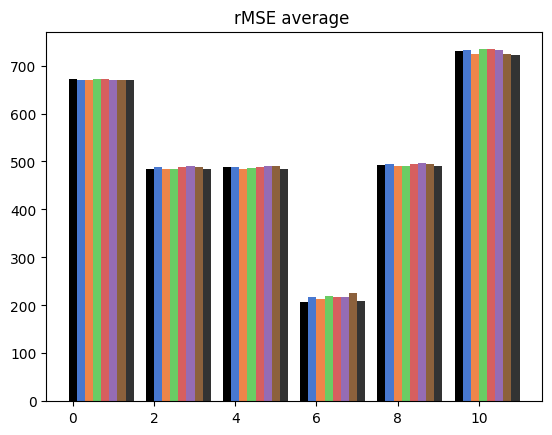

In [ ]:



# Set the width of each bar
bar_width = 0.2

# Set the x positions of the bars
x = np.arange(len(reg_functions)) *1.9


for b, class_function in enumerate(reg_functions):
    filtered_df2 = data[data['Reg Function'] == class_function]
    control = filtered_df2[filtered_df2['Reg Function'] == 'control']
    # Loop through each outlier function
    for c, OR_func in enumerate(outlier_functions):
        if OR_func == 'control' and OR_func == 'eeg-eye-state_normMM':
            continue
        
        filtered_df3 = filtered_df2[filtered_df2['Outlier_Function'] == OR_func]
        pcts=[]
        for a, dataset in enumerate(datasets):
            df = filtered_df3[filtered_df3['Dataset'] == dataset]
            control_val = control[control['Dataset'] == dataset][metric].mean()

            rMSE_mean = df[metric].min()

            rMSE_mean_pct = rMSE_mean/control_val
            pcts.append(rMSE_mean)

        
        rMSE_mean_pct = np.mean(pcts)
        # Plot the bar for each outlier function
        plt.bar(x[b] + (c * bar_width), rMSE_mean_pct, width=bar_width, label=OR_func,color=color_dict[OR_func])

plt.title(f'{metric} average ')

# Add a legend
# ax.legend()

# Show the plot
plt.show()
